# Group #17 - Hien - Khani - Passarelli

In [1]:
# The first thing we do is import the following libraries:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
from datetime import datetime
import seaborn as sns
import scipy.stats as stats
import json
import requests
import scipy
import folium
from scipy.stats import ttest_rel
import branca.colormap as cm

The final goal of the task is to analyze the Taxi's trips in NYC.  

First of all, we need to obtain all the data for the Taxi's trip from January to June $2018$, the *Yellow cabs data*, and we combine that with the dataset with the taxi zone.

In that data there is a lot of information that is not correct. So we clean the dataset in the following way:
- eliminate all trips which are wrongly recorded in months and years;
- eliminate the trip longer than $300$ minutes and less than $1$ minute.

We decide to run the analysis on the borough of departure (*PULocationID* on dataset).

In [2]:
average_month = {} # create an empty dict for average number of trips for each day for each month
num_day = 0

for i in range(6):
    data_month = pd.read_csv('yellow_tripdata_2018-0%s.csv' %(str(i+1)), sep=',', 
                           usecols=['tpep_pickup_datetime', 'tpep_dropoff_datetime',
                                    'PULocationID','DOLocationID','payment_type',
                                    'trip_distance','passenger_count','fare_amount']) 
    # read the taxi_zone_lookup.csv file
    boro = pd.read_csv('taxi_zone_lookup.csv')
    boro = boro[['LocationID', 'Borough','Zone']].set_index('LocationID','Zone')
    boro.columns = ['PUBorough','PUZone'] 
    # join the data base on the zones 
    data_month = data_month.join(boro, on = 'PULocationID', how = 'left')
    boro.columns = ['DOBorough','DOZone']
    data_month = data_month.join(boro, on = 'DOLocationID', how = 'left')
    # cleaning the data
    data_month['tpep_pickup_datetime'] = pd.to_datetime(data_month['tpep_pickup_datetime'], format="%Y/%m/%d %H:%M:%S")
    data_month['tpep_dropoff_datetime']=pd.to_datetime(data_month['tpep_dropoff_datetime'], format="%Y/%m/%d %H:%M:%S")
    
    data_month = data_month.loc[(data_month['tpep_pickup_datetime'].dt.year == 2018) & 
                            (data_month['tpep_dropoff_datetime'].dt.year == 2018) &
                            (data_month['tpep_pickup_datetime'].dt.month == (i+1)) & 
                            (data_month['tpep_dropoff_datetime'].dt.month <= (i+2))]
    pickup_time = pd.to_datetime(data_month['tpep_pickup_datetime'], format = "%Y/%m/%d %H:%M:%S")
    dropoff_time = pd.to_datetime(data_month['tpep_dropoff_datetime'], format = "%Y/%m/%d %H:%M:%S")
    delta = (dropoff_time - pickup_time).astype('timedelta64[m]') # trip duration calculated in minutes
    data_month['trip_duration'] = delta
    data_month = data_month.loc[(data_month['trip_duration'] <= 300) & (data_month['trip_duration'] >=1)]
    # calculate the average number of trips per day
    month_usage_day = len(data_month['PULocationID'])
    days = data_month['tpep_dropoff_datetime'].dt.day
    average_month[i]=month_usage_day//(len(days.unique()))
    num_day = num_day +  len(days.unique())
    # concatenate all data from different months
    try:
        data = pd.concat([data_month, data] , ignore_index=True, sort = False)
    except:
        data = data_month
    del data_month

## [RQ1] In what period of the year Taxis are used more?

Text(0.5,1,'Average number of trips for each day of each month')

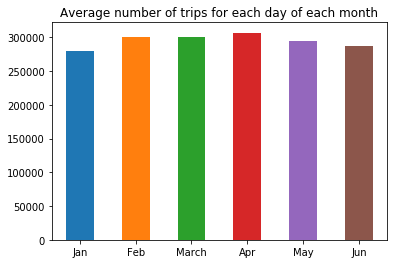

In [3]:
average_month = pd.Series(average_month)
month = ['Jan','Feb','March','Apr','May','Jun']
for i in range(len(average_month)):
    average_month[month[i]] = average_month.pop(i)
ax = average_month.plot.bar(rot=0)
ax.set_title('Average number of trips for each day of each month')

Based on the plot, we can see that during April taxis are used more.

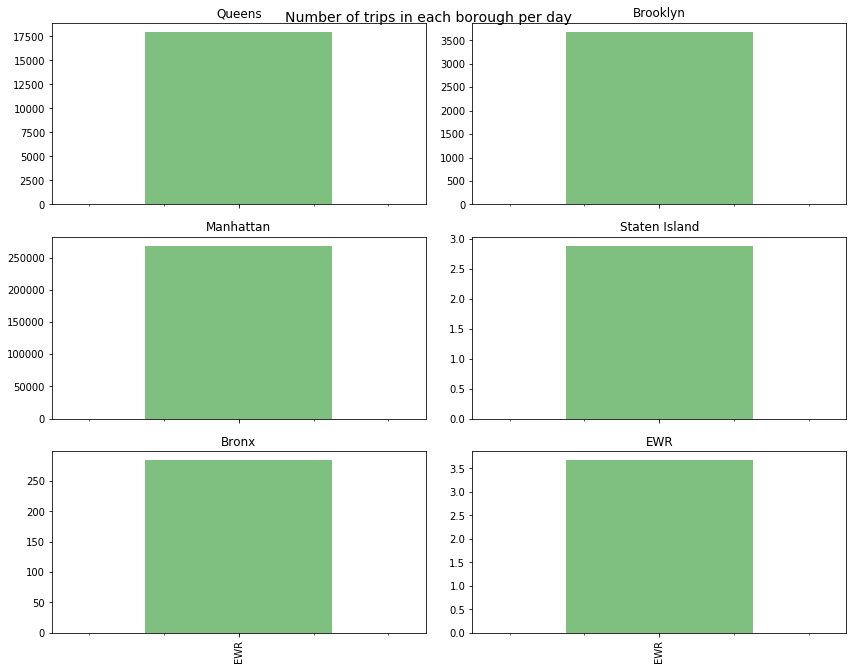

In [4]:
boro_list = ['Queens', 'Manhattan', 'Bronx', 'Brooklyn', 'Staten Island', 'EWR'] # create a list of boroughs
# plot the average number of trips per day for each month
f, axes = plt.subplots(3, 2, figsize=(12, 10), sharex=True)
f.suptitle("Number of trips in each borough per day", fontsize=14)
count_x = 0
count_y = 0
for i in boro_list:
    borough = data.loc[data["PUBorough"] == i]
    month_usage = pd.value_counts(borough["PUBorough"])/num_day
    plt.tight_layout()
    month_usage.plot.bar(alpha = 0.5, color = 'green',ax=axes[count_x,count_y])
    axes[count_x,count_y].set_title(i)
    count_x += 1
    if count_x == 3:
        count_x = 0
        count_y = 1

The majority of trips are from Manhattan at around 250000 in number. This is followed by Queens with more than 17500 total trips and then Brooklyn at 3500 trips. By contrast, in 6 months, there are less than 5 yellow-taxi trips per day in Staten Island and EWR.

## [RQ2] What are the time slots with more passengers?

In [5]:
data['PUhour'] = data['tpep_pickup_datetime'].dt.hour
# define time slots
time_slots = ['1.[1-3 AM]','2.[4-6 AM]','3.[7-9 AM]','4.[10-00 AM]',
              '5.[1-3 PM]','6.[4-6 PM]','7.[7-9 PM]','8.[10-00 PM]']
ny_data = data.copy() #copy the to new dataframe

### Step1: Plot the data for all NYC in six months.

Text(0.5,1,'Overall New York')

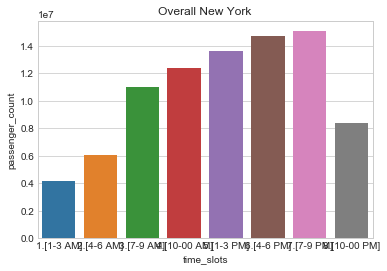

In [6]:
ny_data['time_slots'] = ny_data.PUhour.apply(lambda x:time_slots[abs((x-1)//3)])
ny_data=ny_data.groupby('time_slots',as_index=False).sum()
ny_data.sort_values(by='time_slots',inplace=True)
sns.set_style("whitegrid")
fig = sns.barplot(x=ny_data.time_slots,y=ny_data.passenger_count)
fig.set_title('Overall New York')

We observe that the taxis run most frequently during 7-9 PM, least at midnight onwards from 1-3 AM. Coming in second in terms of frequency is the time slot of 4-6 PM.

In [7]:
del ny_data # delete the unused data

### Step 2: Plot for the other boroughs.

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


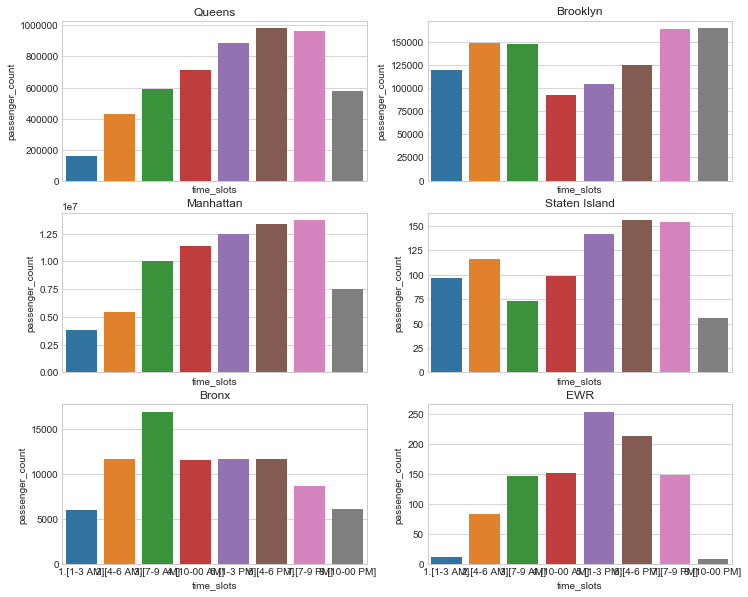

In [8]:
f, axes = plt.subplots(3, 2, figsize=(12, 10), sharex=True)
count_x = 0
count_y = 0
for i in boro_list:
    borough = data.loc[data["PUBorough"] == i]
    borough['time_slots'] = borough.PUhour.apply(lambda x:time_slots[abs((x-1)//3)])
    borough=borough.groupby('time_slots',as_index=False).sum()
    borough.sort_values(by='time_slots',inplace=True)
    sns.set_style("whitegrid")
    fig = sns.barplot(x=borough.time_slots,y=borough.passenger_count,ax=axes[count_x,count_y])
    axes[count_x,count_y].set_title(i)
    count_x += 1
    if count_x == 3:
        count_x = 0
        count_y = 1

Manhattan and Queens have the similar distributions to the whole of New York while the other boroughs showing different trends. For instance, for Bronx the most popular time slot is from 7 to 9 AM.

## [RQ3] Do the all trips last the same?
The first thing we do is select from the data only the two columns we need in this analysis: 
1. *Borough* with the six boroughs that correspond to the zone in which the taximeter was engaged; 
2. *trip_duration* with the duration of trip in minutes.

In [9]:
data3 = data[['PUBorough','trip_duration']]

### Step1: Do the analysis for NYC.

We create a new Pandas DataFrame with the minutes of all trip and the number of trip associated, and then we clean this data eliminating the trip with negative duration and the trips that last more than an hour.

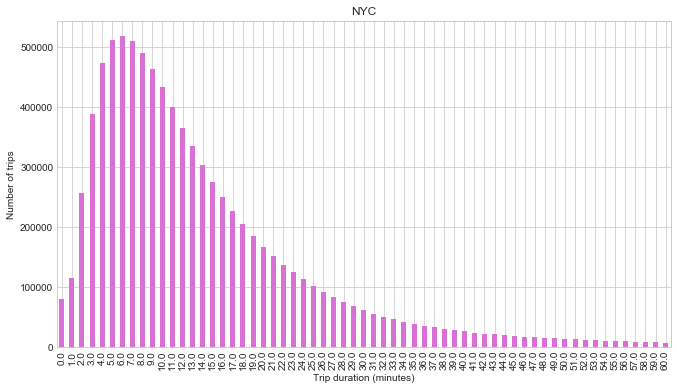

In [10]:
numb_trip = pd.DataFrame(delta.value_counts(), columns = ['Numbers_trip'])
numb_trip = numb_trip[numb_trip.index >= 0] 
distro = numb_trip[numb_trip.index <= 60] 

distro = distro.sort_index()
distro.plot.bar(legend=False, figsize=(11,6), title='NYC', color='orchid')
plt.xlabel('Trip duration (minutes)')
plt.ylabel('Number of trips')
plt.show()

We observe that throughout NYC there are many trips that have a short duration, less than 14 minutes. In the previous plot we consider only the data with trip duration less than 60 minutes, because we observe that the numbers of that trip tend to zeros.

### Step 2: Do the analysis for each borough.

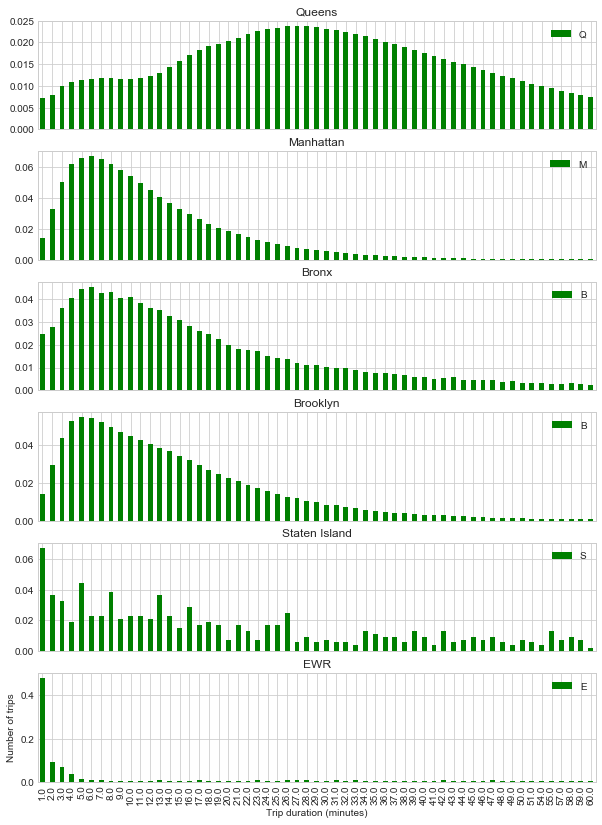

In [11]:
# We create a list with the boroughs' names and create a plot for each of them
f, axes = plt.subplots(6, 1, figsize=(10, 14), sharex=True)
plt.xlabel('Trip duration (minutes)')
plt.ylabel('Number of trips')

count = 0
for i in boro_list:
    borough = data3.loc[data3["PUBorough"] == i]
    delta_borough = borough['trip_duration']
    trip_borough = pd.DataFrame(delta_borough.value_counts()/borough['trip_duration'].size)
    trip_borough = trip_borough[trip_borough.index >= 0]
    distro_borough = trip_borough[trip_borough.index <= 60] 
    distro_borough = distro_borough.sort_index()
    p_borough = distro_borough.plot.bar(ax=axes[count], color='g')
    p_borough.legend(i)
    axes[count].set_title(i)
    count += 1
plt.show()

By this plots, we observe that:
- Manhattan, Bronx and Brooklyn's boroughs (respectively second, third and fourth plot) have the same distribution of NYC: there are many trips that have a short duration, less than 20 minutes;
- in Queen's borough the trips have a long duration: the majority of the trip lasts around 30 minutes;
- in the borough of Staten Island and EWR the number of trip is less than the other borough, and they don't influence the analysis of the entire NYC. In particular in EWR there are a lot of trips that last only 1 minute. 

At the end, to clear the memory, we delete the dataframe used in this question.

In [12]:
del data3
del borough 

## [RQ4] What is the most common way of payments? 
First of all we create a new data selecting the following columns by the dataset *data*:
- *Borough* with the six boroughs that correspond to the zone in which the taximeter was engaged; 
- *payment_type*, a numeric code signifying how the passenger paid for the trip: 
    1. Credit card 
    2. Cash
    3. No charge 
    4. Dispute

In [13]:
data4 = data[['PUBorough','payment_type']]

In [14]:
# We create the datasets for each borough
Queens = data4.loc[data4["PUBorough"] == 'Queens']
Manhattan = data4.loc[data4["PUBorough"] == 'Manhattan']
Bronx = data4.loc[data4["PUBorough"] == 'Bronx']
Brooklyn = data4.loc[data4["PUBorough"] == 'Brooklyn']
StatenIs = data4.loc[data4["PUBorough"] == 'Staten Island']
EWR = data4.loc[data4["PUBorough"] == 'EWR']

Queens = Queens.groupby(by = 'payment_type')['PUBorough'].count()/(Queens['PUBorough'].size)
Manhattan = Manhattan.groupby(by = 'payment_type')['PUBorough'].count()/(Manhattan['PUBorough'].size)
Bronx = Bronx.groupby(by = 'payment_type')['PUBorough'].count()/(Bronx['PUBorough'].size)
Brooklyn = Brooklyn.groupby(by = 'payment_type')['PUBorough'].count()/(Brooklyn['PUBorough'].size)
StatenIs = StatenIs.groupby(by = 'payment_type')['PUBorough'].count()/(StatenIs['PUBorough'].size)
EWR = EWR.groupby(by = 'payment_type')['PUBorough'].count()/(EWR['PUBorough'].size)

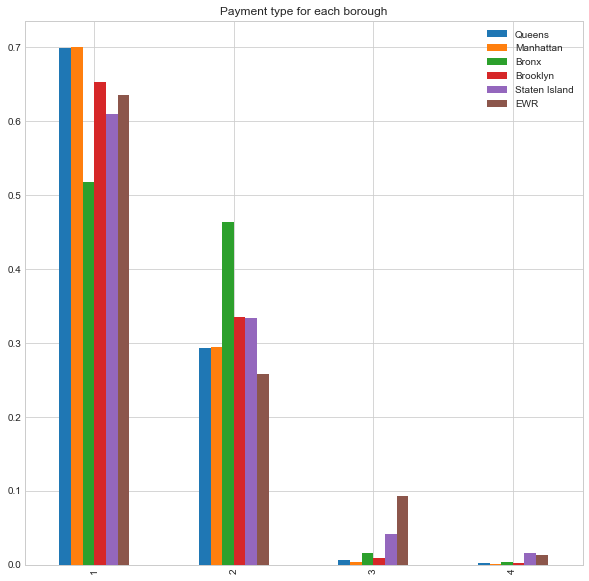

In [15]:
ax = pd.DataFrame(np.c_[Queens,Manhattan,Bronx,Brooklyn,StatenIs,EWR], index=[1,2,3,4])
ax = ax.plot.bar(legend=True, title='Payment type for each borough', figsize=(10,10))
ax.legend(["Queens", "Manhattan", "Bronx", "Brooklyn", "Staten Island", "EWR"])
plt.show()

By this plot we can observe that the most used payment type for all months is cash, the first type. There is an exception for Bronx where we can see that the second type of payment is also common.

### Chi-squared test
Chi-squared test is a statistical hypothesis test where the sampling distribution of the test statistic is a chi-squared distribution when the null hypothesis is true. This test is often constructed from a sum of squared errors.

The null hypothesis is that the chosen district from which the taxi is taken is independent of the payment type chosen.

In [16]:
tab = pd.crosstab(data4['PUBorough'], data4['payment_type'], margins=True)
tab.index = ["Bronx","Brooklyn","EWR","Manhattan", "Queens", "Staten_Island", "Other", "col_total"]
tab.columns = ["1","2","3","4","row_total"]
tab

,1,2,3,4,row_total
Bronx,26657,23884,780,217,51538
Brooklyn,436283,224077,5651,1561,667572
EWR,423,172,62,9,666
Manhattan,34026225,14304043,191420,56665,48578353
Queens,2275079,953066,22728,6542,3257415
Staten_Island,318,174,22,8,522
Other,548836,237044,6977,1528,794385
col_total,37313821,15742460,227640,66530,53350451


In [17]:
observed = tab.iloc[0:7,0:4]

expected =  np.outer(tab["row_total"][0:7], tab.loc["col_total"][0:4]) / 53350451 
# where the number 53350451 is the sum of row_total and col_total
expected = pd.DataFrame(expected)
expected.index = ["Bronx","Brooklyn","EWR","Manhattan", "Queens", "Staten_Island", "Other"]
expected.columns = ["1","2","3","4"]

In [18]:
chi_squared_stat = (((observed-expected)**2)/expected).sum().sum()
p_values = 1 - stats.chi2.cdf(x=chi_squared_stat, df=18)
print('The chi-squared coefficient is', chi_squared_stat, 'and the p-value is', p_values)

The chi-squared coefficient is 32900.58151370933 and the p-value is 0.0


We interpreter p_values $= 0.0$ as p_values $< 0.001$.

Under the null hypothesis, the degrees of freedom are equal to product of number of categories in each variables minus 1. In this case we have $7 \times 4$ table, so $\text{df}=6 \times 3=18$.

We can check all this information with the following function: the output shows the chi-squared statistic, the p-value and the degrees of freedom by the expected counts. 

In [19]:
chi2, p, df, expected = stats.chi2_contingency(observed=observed)
print(chi2)
print(p)

32900.58151370933
0.0


If the test statistic is improbably large according to that chi-squared distribution, then one rejects the null hypothesis of independence. 

In [20]:
del data4

## [RQ5] Does a long distance correlate with the duration of the trip on average? 
First of all we create a new data selecting the following columns by the dataset *data*:
- *trip_duration* with the duration of trip, in minutes;
- *trip_distance* with the elapsed trip distance in miles reported by the taximeter.

In [21]:
data5 = data[['trip_duration','trip_distance']]

### Pearson Coefficient
The *Pearson coefficient* is a measure of the linear correlation between two datasets. It varies between $-1$ and $+1$, with $0$ implying there is not correlation. 
- If the coefficient is equal to $-1$ or $+1$ imply an exact linear relationship; 
- Positive correlations imply that as x increases, so does y; 
- Negative correlations imply that as x increases, y decreases. 

We compute the coefficient using the entire dataset, by the function **scipy.stats.pearsonr(x,y)** from the library **scipy.stats**, where $\textbf{x}$ is the column of trip distance, and $\textbf{y}$ is the column of trip duration, expressed in minutes.

In [22]:
x=np.array(data5['trip_distance'])
y=np.array(data5['trip_duration'])

r, p = stats.pearsonr(x,y) # r: Pearson’s correlation coefficient, p = p-value
print('The Pearson\'s correlation coefficient is', r)

The Pearson's correlation coefficient is 0.11319429582465505


The correlation coefficient  𝑟>0 , then there is a positive correlation between the two datatsets, so they are not independent.

Then, to make a plot that show the linear relationships between distance and duration of the trip
1. we use a sample of the data: we take a sample of $10000$ data randomly choosen by the function of pandas library **DataFrame.sample( )**;
2. we use **seaborn.lmplot( )**.

In [23]:
data5 = data5.sample(10000)

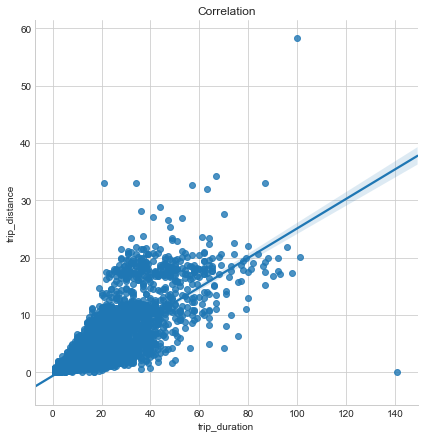

In [24]:
sns.lmplot(x='trip_duration', y='trip_distance', data=data5, size=6)
plt.title("Correlation")
plt.show()

We also draw a plot of two variables *trip_duration* and *trip_distance* with bivariate and univariate graphs, using the function **seaborn.jointplot( )**.

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


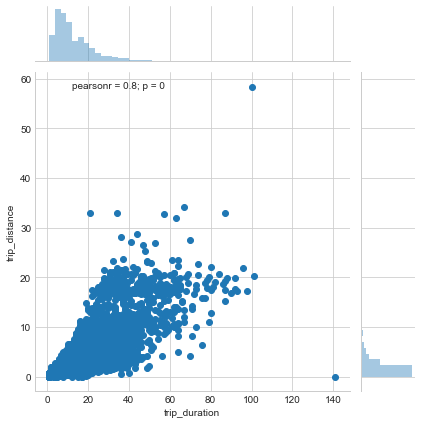

In [25]:
sns.jointplot(x='trip_duration', y='trip_distance', data=data5)
plt.show()

# Core Research Q1

The first step is to get the data of the necessary columns for the Core Research Questions. We further clean the data with the following criteria:
-  eliminate all trips with distance less than $0.2$ miles and fare amount less than $2.5$.

In [26]:
trip = data.loc[(data.trip_distance > 0.2) & (data.fare_amount > 2.5),
                ['trip_distance','fare_amount','trip_duration','PUBorough','DOBorough','PUZone','DOZone']]
trip.head()

,trip_distance,fare_amount,trip_duration,PUBorough,DOBorough,PUZone,DOZone
1,1.0,5.5,5.0,Manhattan,Manhattan,Times Sq/Theatre District,Midtown Center
2,3.3,13.0,15.0,Manhattan,Manhattan,Garment District,Yorkville West
3,2.0,11.5,15.0,Manhattan,Manhattan,Midtown Center,Union Sq
4,1.5,8.5,10.0,Manhattan,Manhattan,Midtown North,UN/Turtle Bay South
5,0.7,5.0,3.0,Manhattan,Manhattan,Penn Station/Madison Sq West,West Chelsea/Hudson Yards


In [27]:
del data

Compute the mean and std of average fare.

mean of average fare per mile 3.947562353615688
std of average fare per mile 1.1975933572672786


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


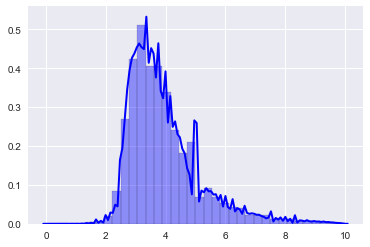

In [28]:
average_fare = (trip['fare_amount']-2.5)/trip['trip_distance']
ave = []
for i in (average_fare):
    if i > 0 and i < 10:
        ave.append(i)
print("mean of average fare per mile",np.mean(ave))
print("std of average fare per mile",np.std(ave))
sns.set(color_codes=True)
sns.distplot(ave, hist=True, kde=True, 
             bins=int(180/5), color = 'blue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2})

The distribution is a unimodal model and slightly skewed left with the peak at around 3. However it has another smaller 'peak' at 5. 

Calculate the average fare for each borough and plot them. Then we store the those average fares in a dict in order to use them for the statistic tests.

For borough Queens:
3.1001992778583896
3.540922562212689


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough Manhattan:
4.10950548776913
42.26957704650105


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough Bronx:
3.7042204340404585
7.464660448008708


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough Brooklyn:
3.556641702231788
2.987760125828303


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough Staten Island:
4.541327858548913
16.38060023355344


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough EWR:
29.31992306904882
70.25469620267089


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


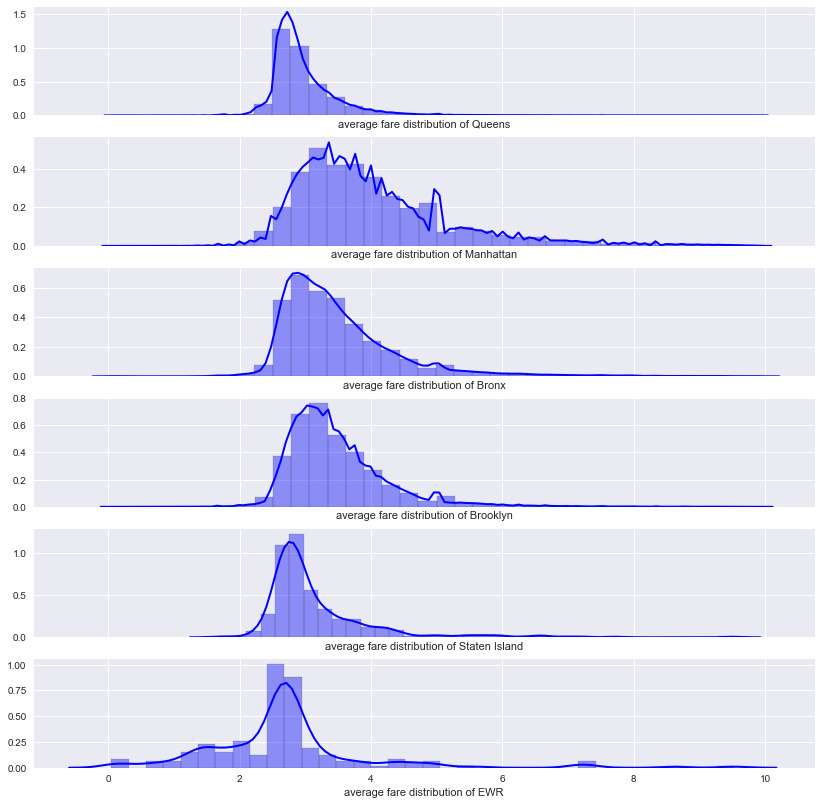

In [29]:
f, axes = plt.subplots(6, 1, figsize=(14, 14), sharex=True)
sns.despine(left=True)
count = 0
ave_fare = {}
for i in boro_list:
    if i == 'EWR':
        fare = trip.loc[trip["PUBorough"] == i][['trip_distance', 'fare_amount']]
        ave_fare[i] = (fare['fare_amount']-20)/fare['trip_distance'] #not taking into account 20$ initial subcharge for airport
    else:
        fare = trip.loc[trip["PUBorough"] == i][['trip_distance', 'fare_amount']]
        ave_fare[i] = (fare['fare_amount']-2.5)/fare['trip_distance'] #not taking into account 2.5$ initial subcharge
    print('For borough %s:' %(i))
    print(np.mean(ave_fare[i]))
    print(np.std(ave_fare[i]))
    ave0 = []
    for j in (ave_fare[i]):
        if j > 0 and j < 10:
            ave0.append(j)
    ave0 = pd.Series(ave0, name=("average fare distribution of " + i))
    sns.distplot(ave0, hist=True, kde=True, 
                bins=int(180/5), color = 'blue', 
                hist_kws={'edgecolor':'black'},
                kde_kws={'linewidth': 2},
                ax=axes[count],
                )
    count += 1

## STATISTIC TESTS

 Null hypothesis: The average price per kilometer in each borough is the same
 
 H1: The average price per kilometer in each borough is significantly different
 
 Due to different sample sizes between the boroughs, we will take the largest sample size possible which also is the size of the smaller borough group.
 
 Paired Student’s t-Test is used in this case.

In [30]:
for k, v in ave_fare.items():
    for k1, v1 in ave_fare.items():
        if k == k1:
            break
        else:
            print('Comparing average fare of %s and %s' % (k, k1))
            if len(v) >= len(v1):
                # compare samples
                stat, p = ttest_rel(v[:len(v1)], v1)
                print('Statistics=%.3f, p=%.3f' % (stat, p))
                # interpret
                alpha = 0.05
                if p > alpha:
                    print('Same distributions (accept H0)')
                else:
                    print('Different distributions (reject H0)')
            else:
                # compare samples
                stat, p = ttest_rel(v, v1[:len(v)])
                print('Statistics=%.3f, p=%.3f' % (stat, p))
                # interpret
                alpha = 0.05
                if p > alpha:
                    print('Same distributions (accept H0)')
                else:
                    print('Different distributions (reject H0)')

Comparing average fare of Manhattan and Queens
Statistics=454.724, p=0.000
Different distributions (reject H0)
Comparing average fare of Bronx and Queens
Statistics=13.125, p=0.000
Different distributions (reject H0)
Comparing average fare of Bronx and Manhattan
Statistics=5.482, p=0.000
Different distributions (reject H0)
Comparing average fare of Brooklyn and Queens
Statistics=75.831, p=0.000
Different distributions (reject H0)
Comparing average fare of Brooklyn and Manhattan
Statistics=-111.453, p=0.000
Different distributions (reject H0)
Comparing average fare of Brooklyn and Bronx
Statistics=-4.258, p=0.000
Different distributions (reject H0)
Comparing average fare of Staten Island and Queens
Statistics=2.357, p=0.019
Different distributions (reject H0)
Comparing average fare of Staten Island and Manhattan
Statistics=1.626, p=0.105
Same distributions (accept H0)
Comparing average fare of Staten Island and Bronx
Statistics=1.105, p=0.270
Same distributions (accept H0)
Comparing ave

Based on the test results above, we can see that the average fare price in Newark Liberty International Airport is significantly different from other boroughs(we are considering the initial pick-up location in this case). Next one to notice is the average fare price in Queens as it is also different from other boroughs'.

We then compute the weighted mean and std of average fare

mean of 25.16290244703633
std of 17.90190675754718


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


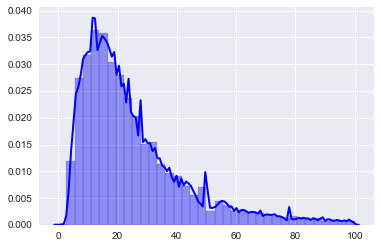

In [31]:
Pprime = average_fare * (trip['trip_duration']/trip['trip_distance'])
Pave = []
for i in (Pprime):
    if i > 0 and i < 100:
        Pave.append(i)
print("mean of",np.mean(Pave))
print("std of",np.std(Pave))
sns.set(color_codes=True)
sns.distplot(Pave, hist=True, kde=True, 
             bins=int(180/5), color = 'blue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2})

The distribution model is unimodal and heavily skewed to the left. The peak is at around 15.

Then we compute the average fare and standard deviation for each borough and print the result out

Calculate the weighted average fare for each borough and plot them. Then we store the those average fares in a dict in order to use them for the statistic tests 

For borough Queens:
11.361006166185243
274.2653757878746


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough Manhattan:
31.371973228430395
247.8923417279193


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough Bronx:
26.347922191165065
720.8346149687825


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough Brooklyn:
19.60494474548939
58.72704186518603


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough Staten Island:
28.343410827500467
185.28034126044003


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


For borough EWR:
183.719209512747
1770.4933475183914


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


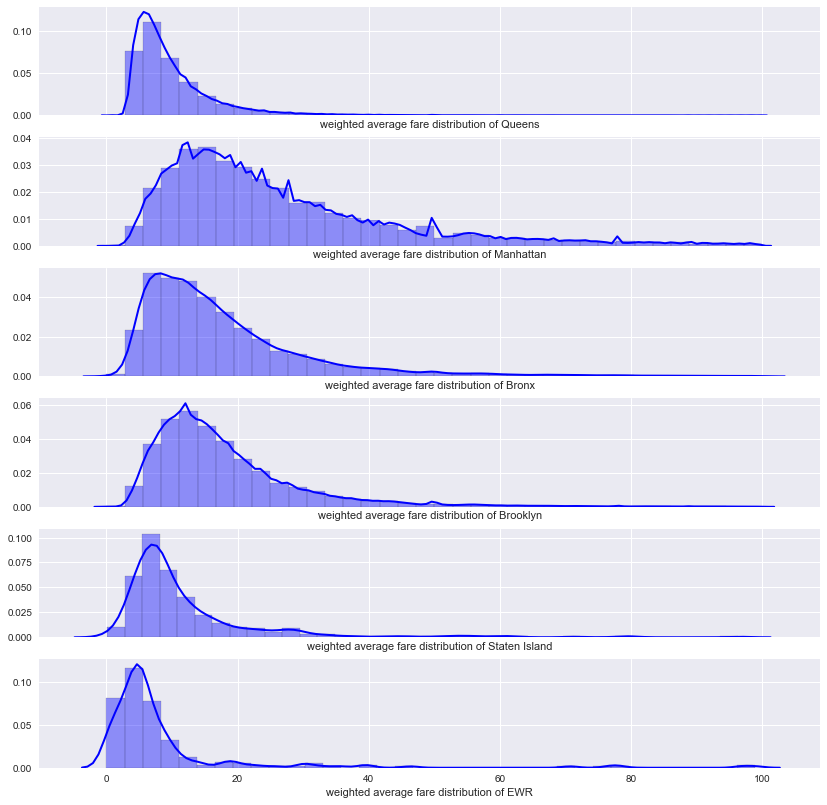

In [32]:
f, axes = plt.subplots(6, 1, figsize=(14, 14), sharex=True)
sns.despine(left=True)
count = 0
weighted_average_fare = {}
for i in boro_list:
    if i == 'EWR':
        fare = trip.loc[trip["PUBorough"] == i][['trip_distance', 'fare_amount','trip_duration']]
        weighted_average_fare[i] = (fare['fare_amount']-20)/fare['trip_distance'] * (fare['trip_duration']/fare['trip_distance']) #not taking into account 20$ initial subcharge for airport
    else:
        fare = trip.loc[trip["PUBorough"] == i][['trip_distance', 'fare_amount','trip_duration']]
        weighted_average_fare[i] = (fare['fare_amount']-2.5)/fare['trip_distance'] * (fare['trip_duration']/fare['trip_distance']) #not taking into account 2.5$ initial subcharge
    print('For borough %s:' %(i))
    print(np.mean(weighted_average_fare[i]))
    print(np.std(weighted_average_fare[i]))
    ave1 = []
    for j in (weighted_average_fare[i]):
        if j > 0 and j < 100:
            ave1.append(j)
    ave1 = pd.Series(ave1, name=("weighted average fare distribution of " + i))
    sns.distplot(ave1, hist=True, kde=True, 
                bins=int(180/5), color = 'blue', 
                hist_kws={'edgecolor':'black'},
                kde_kws={'linewidth': 2},
                ax=axes[count])
    count += 1

## STATISTIC TESTS

Null hypothesis: The average price per kilometer in each borough is the same

H1: The average price per kilometer in each borough is significantly different

Due to different sample sizes between the boroughs, we will take the largest sample size possible which also is the size of the smaller borough group.

We used paired Student’s t-Test.

In [33]:
for k, v in weighted_average_fare.items():
    for k1, v1 in weighted_average_fare.items():
        if k == k1:
            break
        else:
            print('Comparing weighted average fare of %s and %s' % (k, k1))
            if len(v) >= len(v1):
                # compare samples
                stat, p = ttest_rel(v[:len(v1)], v1)
                print('Statistics=%.3f, p=%.3f' % (stat, p))
                # interpret
                alpha = 0.05
                if p > alpha:
                    print('Same distributions (accept H0)')
                else:
                    print('Different distributions (reject H0)')
            else:
                # compare samples
                stat, p = ttest_rel(v, v1[:len(v)])
                print('Statistics=%.3f, p=%.3f' % (stat, p))
                # interpret
                alpha = 0.05
                if p > alpha:
                    print('Same distributions (accept H0)')
                else:
                    print('Different distributions (reject H0)')

Comparing weighted average fare of Manhattan and Queens
Statistics=127.717, p=0.000
Different distributions (reject H0)
Comparing weighted average fare of Bronx and Queens
Statistics=4.671, p=0.000
Different distributions (reject H0)
Comparing weighted average fare of Bronx and Manhattan
Statistics=2.075, p=0.038
Different distributions (reject H0)
Comparing weighted average fare of Brooklyn and Queens
Statistics=48.698, p=0.000
Different distributions (reject H0)
Comparing weighted average fare of Brooklyn and Manhattan
Statistics=-92.830, p=0.000
Different distributions (reject H0)
Comparing weighted average fare of Brooklyn and Bronx
Statistics=-2.216, p=0.027
Different distributions (reject H0)
Comparing weighted average fare of Staten Island and Queens
Statistics=2.548, p=0.011
Different distributions (reject H0)
Comparing weighted average fare of Staten Island and Manhattan
Statistics=1.423, p=0.155
Same distributions (accept H0)
Comparing weighted average fare of Staten Island a

Based on the test results, we can see that the weight average price per mile is divided into 2 groups. The group with higher weighted average price includes Manhattan, Bronx, Staten Island and Newark Liberty International Airport. The other includes Queens and Brooklyn. These two groups have a significant difference in weighted average price indicating that the former group is the one of busy boroughs with longer waiting time.

# Core Research Q2

Counting the number of trips starting in each zone

In [34]:
PUZone_count = pd.value_counts(trip['PUZone']).sort_index()
DOZone_count = pd.value_counts(trip['DOZone']).sort_index()

In [35]:
df = pd.DataFrame(data=PUZone_count)
df.to_json('df.json')
df = df.reset_index()
df.columns = ['Zone', 'Number']
df = df.set_index('Zone')['Number']

Choropleph the map. The colour is linear ranging from green to orange and to red. The zone that has no data recorded is coloured gray.

In [36]:
url = 'https://raw.githubusercontent.com/CriMenghini/ADM-2018/master/Homework_2/taxi_zones.json'
response = requests.get(url)

In [37]:
linear = cm.LinearColormap(
    ['green', 'yellow', 'red'],
    vmin=0, vmax=1000000
)
def style_function(feature):
    zone = df.get(feature['properties']['zone'])
    return {
        'fillColor': '#gray' if zone is None else linear(zone),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 0.2,
    }
nyc1 = folium.Map([40.7,-74.0], zoom_start=11)
folium.GeoJson(
    response.text,
    style_function = style_function    
).add_to(nyc1)
folium.LayerControl().add_to(nyc1)
nyc1

Counting the number of trips starting and ending in the same zone and convert into data frame:

In [38]:
SameLocation = trip[trip.PUZone == trip.DOZone]
count = pd.value_counts(SameLocation['PUZone']).sort_index()
df1 = pd.DataFrame(data=count)
df1.to_json('df1.json')
df1 = df1.reset_index()
df1.columns = ['Zone', 'Number']
df1 = df1.set_index('Zone')['Number']

We choropleph the map. The colour is linear ranging from green to orange and to red. The zone that has no data recorded is coloured gray.

In [39]:
linear1 = cm.LinearColormap(
    ['green', 'yellow', 'red'],
    vmin=0, vmax=100000
)
def style_function1(feature):
    zone = df1.get(feature['properties']['zone'])
    return {
        'fillColor': '#gray' if zone is None else linear1(zone),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 0.2,
    }
nyc_samelocation1 = folium.Map([40.7,-74.0], zoom_start=11)
folium.GeoJson(
    response.text,
    style_function = style_function1    
).add_to(nyc_samelocation1)
folium.LayerControl().add_to(nyc_samelocation1)
nyc_samelocation1

Based on the visualization, we observe that the majority of trips started in zones in Manhattan and ended in the same zones.